# VisionTransformer finetuning attention

In [1]:
import torch

print("CUDA Available:", torch.cuda.is_available())
print("GPU Count:", torch.cuda.device_count())
if torch.cuda.is_available():
    print("GPU Name:", torch.cuda.get_device_name(0))


CUDA Available: True
GPU Count: 1
GPU Name: NVIDIA GeForce RTX 4070 Ti SUPER


In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
from PIL import Image
from torchvision import transforms

In [3]:
import random
# 再現性のためにランダムシードを設定
def set_seed(seed):
    random.seed(seed) # Python
    np.random.seed(seed) # NumPy
    torch.manual_seed(seed) # PyTorch
    
    # GPUを使う場合
    if torch.cuda.is_available():
        torch.cuda.manual_seed(seed)
        torch.cuda.manual_seed_all(seed)
        torch.backends.cudnn.deterministic = True
        torch.backends.cudnn.benchmark = False # 再現性を重視

set_seed(42)  # 任意のシード値

- Pillow は RGB、OpenCV は BGRで読み込む

In [4]:
metadata = pd.read_csv("./data/HAM10000_metadata")
metadata

,lesion_id,image_id,dx,dx_type,age,sex,localization,dataset
0,HAM_0000118,ISIC_0027419,bkl,histo,80.0,male,scalp,vidir_modern
1,HAM_0000118,ISIC_0025030,bkl,histo,80.0,male,scalp,vidir_modern
2,HAM_0002730,ISIC_0026769,bkl,histo,80.0,male,scalp,vidir_modern
3,HAM_0002730,ISIC_0025661,bkl,histo,80.0,male,scalp,vidir_modern
4,HAM_0001466,ISIC_0031633,bkl,histo,75.0,male,ear,vidir_modern
...,...,...,...,...,...,...,...,...
10010,HAM_0002867,ISIC_0033084,akiec,histo,40.0,male,abdomen,vidir_modern
10011,HAM_0002867,ISIC_0033550,akiec,histo,40.0,male,abdomen,vidir_modern
10012,HAM_0002867,ISIC_0033536,akiec,histo,40.0,male,abdomen,vidir_modern
10013,HAM_0000239,ISIC_0032854,akiec,histo,80.0,male,face,vidir_modern


In [5]:
metadata.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10015 entries, 0 to 10014
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   lesion_id     10015 non-null  object 
 1   image_id      10015 non-null  object 
 2   dx            10015 non-null  object 
 3   dx_type       10015 non-null  object 
 4   age           9958 non-null   float64
 5   sex           10015 non-null  object 
 6   localization  10015 non-null  object 
 7   dataset       10015 non-null  object 
dtypes: float64(1), object(7)
memory usage: 626.1+ KB


In [6]:
metadata_labels = metadata[['image_id', 'dx']]
metadata_labels

,image_id,dx
0,ISIC_0027419,bkl
1,ISIC_0025030,bkl
2,ISIC_0026769,bkl
3,ISIC_0025661,bkl
4,ISIC_0031633,bkl
...,...,...
10010,ISIC_0033084,akiec
10011,ISIC_0033550,akiec
10012,ISIC_0033536,akiec
10013,ISIC_0032854,akiec


In [7]:
labels = metadata_labels['dx'].map({"akiec":0, "bcc":1, "bkl":2, "df":3, "mel":4, "nv":5, "vasc":6})
labels

0        2
1        2
2        2
3        2
4        2
        ..
10010    0
10011    0
10012    0
10013    0
10014    4
Name: dx, Length: 10015, dtype: int64

In [8]:
# 画像ファイル名を取得
image_id = metadata_labels["image_id"].values
image_id

array(['ISIC_0027419', 'ISIC_0025030', 'ISIC_0026769', ...,
       'ISIC_0033536', 'ISIC_0032854', 'ISIC_0032258'], dtype=object)

In [9]:
# ラベルを取得
labels = labels.values
labels

array([2, 2, 2, ..., 0, 0, 4])

In [10]:
# インデックスを分割
from sklearn.model_selection import train_test_split

train_idx, val_idx = train_test_split(
    np.arange(len(image_id)),
    test_size = 0.3,
    stratify=labels, # クラスごとに均等に分割
    random_state = 42
)

In [11]:
val_idx

array([2301, 9459, 5232, ..., 2684, 8186, 5665])

### Vitの前処理

In [12]:
from timm.data import resolve_data_config
import torchvision.transforms as transforms
import timm

# モデルの前処理設定を取得
model = timm.create_model("vit_base_patch16_224", pretrained=True)
config = resolve_data_config({}, model=model)
config

{'input_size': (3, 224, 224),
 'interpolation': 'bicubic',
 'mean': (0.5, 0.5, 0.5),
 'std': (0.5, 0.5, 0.5),
 'crop_pct': 0.9,
 'crop_mode': 'center'}

In [13]:
config["input_size"][1:]

(224, 224)

In [14]:
from timm.data import create_transform

train_transform = create_transform(
    input_size=224,  # ViTの入力サイズ
    is_training=True,  # 学習時のデータ拡張を有効化
    auto_augment="rand-m9-mstd0.5-inc1",  # RandAugment + 正規化の設定
    interpolation="bicubic"  # 画像の補間方法
)

val_transform = create_transform(
    input_size=224,
    is_training=False  # 検証時はデータ拡張なし
)

In [15]:
# ImageDataset クラスを定義し、データローダーで取得
from torch.utils.data import Dataset, DataLoader

image_path = "./data/images"

class ImageDataset(Dataset):
    def __init__(self, image_id, labels, transform=None):
        self.image_id = [f if f.endswith('.jpg') else f + ".jpg" for f in image_id] # 拡張子を追加
        self.labels = labels
        self.transform = transform

    def __len__(self):
        return len(self.image_id)
    
    def __getitem__(self, idx):
        # 画像を指定するディレクトリを作成
        img_path = os.path.join(image_path, self.image_id[idx]) # self.image_id[idx]は画像ファイル名
        
        # ファイルが存在しない場合のエラー
        if not os.path.exists(img_path):
            raise FileNotFoundError(f"File not found: {img_path}")
        
        # ディレクトリで画像を指定しPIL形式で開き、#チャンネルに変換する
        img = Image.open(img_path).convert("RGB")
        if self.transform:
            img = self.transform(img)

        label  = torch.tensor(self.labels[idx], dtype=torch.long)
        return img, label

In [16]:
# CustomSubsetクラス
class CustomSubset(Dataset):
    def __init__(self, dataset, indices, transform=None):
        self.dataset = dataset
        self.indices = indices
        self.transform = transform
    
    def __len__(self):
        return len(self.indices)
    
    def __getitem__(self, idx):
        img, label = self.dataset[self.indices[idx]] # 元のデータセットから取得
        if self.transform:
            img = self.transform(img)
        
        return img, label

In [17]:
# 画像とラベルのデータセットを作成
dataset = ImageDataset(image_id, labels, transform=None)

In [18]:
# データセットの分割
train_dataset = CustomSubset(dataset, train_idx, transform=train_transform)
val_dataset = CustomSubset(dataset, val_idx, transform=val_transform)

In [19]:
# Dataloaderの作成
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)

In [20]:
for imgs, labels in train_loader:
    print(f"Train Batch shape: {imgs.shape}, Labels: {labels}")
    break

for imgs, labels in val_loader:
    print(f"Val Batch shape: {imgs.shape}, Labels: {labels}")
    break

Train Batch shape: torch.Size([32, 3, 224, 224]), Labels: tensor([5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 4, 5, 5, 5, 5, 5, 5, 2, 2,
        5, 5, 0, 4, 5, 5, 5, 5])
Val Batch shape: torch.Size([32, 3, 224, 224]), Labels: tensor([4, 5, 5, 5, 5, 2, 5, 5, 5, 5, 5, 2, 5, 1, 0, 5, 5, 5, 2, 4, 2, 5, 5, 5,
        5, 5, 2, 5, 0, 5, 5, 4])


In [21]:
import psutil
print(f"使用中メモリ: {psutil.virtual_memory().used / (1024 ** 3):.2f} GB")

使用中メモリ: 4.45 GB


In [22]:
# メモリの削減
# del image_tensors
# import gc
# gc.collect()

## Vit の事前学習済みモデルを適用

- torch.long型は整数系（int64）

In [ ]:
import mlflow
import mlflow.pytorch

# MLflow のトラッキング URI を設定
mlflow.set_tracking_uri("http://127.0.0.1:5000")

# MLflow の実験を設定
mlflow.set_experiment("2503_skin_cancer_classification")

In [22]:
# モデルを定義
import timm
import torch.nn as nn

num_classes = 7

def create_model(model_name="vit_base_patch16_224", num_classes=7):
    model = timm.create_model(model_name, pretrained=True)
    model.head = nn.Linear(model.num_features, 7)
    return model

In [25]:
model = timm.create_model(model_name="vit_base_patch16_224", pretrained=True)
model

VisionTransformer(
  (patch_embed): PatchEmbed(
    (proj): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
    (norm): Identity()
  )
  (pos_drop): Dropout(p=0.0, inplace=False)
  (patch_drop): Identity()
  (norm_pre): Identity()
  (blocks): Sequential(
    (0): Block(
      (norm1): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
      (attn): Attention(
        (qkv): Linear(in_features=768, out_features=2304, bias=True)
        (q_norm): Identity()
        (k_norm): Identity()
        (attn_drop): Dropout(p=0.0, inplace=False)
        (proj): Linear(in_features=768, out_features=768, bias=True)
        (proj_drop): Dropout(p=0.0, inplace=False)
      )
      (ls1): Identity()
      (drop_path1): Identity()
      (norm2): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
      (mlp): Mlp(
        (fc1): Linear(in_features=768, out_features=3072, bias=True)
        (act): GELU(approximate='none')
        (drop1): Dropout(p=0.0, inplace=False)
        (norm): Identity(

In [26]:
import torch.nn.functional as F

def train(model, train_loader, criterion, optimizer, device, mixup_fn):
    model.train()
    train_loss = 0
    train_correct = 0
    total_samples = 0

    for imgs, labels in train_loader:
        imgs, labels = imgs.to(device), labels.to(device)
        imgs, labels = mixup_fn(imgs, labels)

        optimizer.zero_grad()
        outputs = model(imgs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        batch_size = labels.size(0)
        train_loss += loss.item() * batch_size

        # Mixup が適用されなかった場合に one-hot へ変換
        if labels.dim() == 1:
            labels = F.one_hot(labels, num_classes=7).float() # SoftTargetCrossEntropy を使う場合、ラベルは float にする

        train_correct += (outputs.argmax(1) == labels.argmax(1)).sum().item()
        total_samples += batch_size
    
    train_loss /= total_samples
    train_acc = train_correct/ total_samples
    
    return train_loss, train_acc

In [27]:
def evaluate(model, val_loader, val_criterion, device):
    model.eval()
    val_loss = 0
    val_correct = 0
    total_val_samples = 0

    val_criterion = nn.CrossEntropyLoss()  # 評価時は `CrossEntropyLoss` を使用

    with torch.no_grad():
        for batch_idx, (imgs, labels) in enumerate(val_loader):
            imgs, labels = imgs.to(device), labels.to(device)
            outputs = model(imgs)
            print(f"Batch {batch_idx}: labels.shape = {labels.shape}")

            loss = val_criterion(outputs, labels)

            #loss = criterion(outputs, labels)

            batch_size = labels.size(0)
            val_loss += loss.item() * batch_size
            val_correct += (outputs.argmax(1) == labels).sum().item()
            total_val_samples += batch_size
        
    val_loss /= total_val_samples
    val_acc = val_correct / total_val_samples
        
    return val_loss, val_acc,

In [28]:
# モデルの作成・訓練・評価・ログ記録
import torch.optim as optim
from torch.optim.lr_scheduler import CosineAnnealingLR
from timm.data.mixup import Mixup
from timm.loss import SoftTargetCrossEntropy

def objective(train_loader, val_loader, num_classes, num_epochs):
    set_seed(42)
    device = "cuda" if torch.cuda.is_available() else "cpu"

    model = create_model(num_classes=num_classes).to(device)
    criterion = SoftTargetCrossEntropy() # Mixupで変換したラベルを受け取る
    val_criterion = nn.CrossEntropyLoss()
    optimizer =optim.AdamW([
        {"params":model.patch_embed.parameters(), "lr":1e-6}, # 埋め込み層
        {"params":model.blocks.parameters(), "lr": 1e-5}, # Transformerブロック
        {"params":model.head.parameters(), "lr":1e-4} # 分類層
    ])
    scheduler = CosineAnnealingLR(optimizer, T_max=5)
    
    mixup_fn = Mixup(mixup_alpha=0.2, cutmix_alpha=1.0, prob=0.5, num_classes=7)

    best_val_loss = float("inf")
    best_epoch = 0
    best_acc = 0
    best_model_state = None

    # ダミー入力データ（モデルの入力形式を記録するだけ）を作成（バッチサイズ1, チャンネル3, 224x224画像）
    input_example = torch.randn(1, 3, 224, 224).to(torch.float32).cpu().numpy() # mlflowはnumpy配列は受け付ける

    with mlflow.start_run() as run:

        run_id = run.info.run_id
        model_filename = f"best_model_{run_id}.pth"

        # ハイパラメータの記録
        mlflow.log_param("learning_rate", 1e-4)
        mlflow.log_param("batch_size", 32)
        mlflow.log_param("num_epochs", num_epochs)
        mlflow.log_param("loss_function", "SoftTargetCrossEntropy")
        mlflow.log_param("optimizer", "AdamW")

        # データセットの情報を記録
        mlflow.log_param("dataset_path", "./data/HAM10000_metadata.csv")
        mlflow.log_param("num_train_samples", len(train_loader.dataset))
        mlflow.log_param("num_val_samples", len(val_loader.dataset))

        # タグを追加
        mlflow.set_tag("model_name", "Vit_finetuning")
        mlflow.set_tag("dataset", "HAM10000")
        mlflow.set_tag("optimizer", "AdamW")
        mlflow.set_tag("experiment", "skin_cancer_classification")

        for epoch in range(num_epochs):
            train_loss, train_acc = train(model, train_loader, criterion, optimizer, device, mixup_fn)
            val_loss, val_acc = evaluate(model, val_loader, val_criterion, device)

            mlflow.log_metric("train_loss", train_loss, step=epoch)
            mlflow.log_metric("train_acc", train_acc, step=epoch)
            mlflow.log_metric("val_loss", val_loss, step=epoch)
            mlflow.log_metric("val_acc", val_acc, step=epoch)

            # ベストモデルを更新
            if val_loss < best_val_loss:
                best_val_loss = val_loss
                best_epoch = epoch
                best_acc = val_acc
                best_model_state = model.state_dict() # ここで更新
            
            scheduler.step()

            print(f"Epoch {epoch}: Train Loss: {train_loss:.4f}, Train Acc: {train_acc:.4f}, Val Loss: {val_loss:.4f}, Val Acc: {val_acc:.4f}")
        
        # ベストモデルの状態をロード
        model.load_state_dict(best_model_state)
        # ベストモデルを保存
        torch.save(best_model_state, model_filename) # モデルの状態を.pthファイルに記録
        mlflow.log_artifact(model_filename) # MLflow にファイルとして記録  
        # 最終的なbest_model_stateをログする
        mlflow.pytorch.log_model(model, "best_model", input_example=input_example)

        return best_epoch, best_val_loss, best_acc, best_model_state            

In [29]:
num_epochs = 10
best_epoch, best_val_loss, best_acc, best_model_state = objective(train_loader, val_loader, num_classes, num_epochs)

print("Best Epoch:", best_epoch)
print("Best Val Loss:", best_val_loss)
print("Best Acc:", best_acc)
print("Best Model Sate:", best_model_state)

Batch 0: labels.shape = torch.Size([32])
Batch 1: labels.shape = torch.Size([32])
Batch 2: labels.shape = torch.Size([32])
Batch 3: labels.shape = torch.Size([32])
Batch 4: labels.shape = torch.Size([32])
Batch 5: labels.shape = torch.Size([32])
Batch 6: labels.shape = torch.Size([32])
Batch 7: labels.shape = torch.Size([32])
Batch 8: labels.shape = torch.Size([32])
Batch 9: labels.shape = torch.Size([32])
Batch 10: labels.shape = torch.Size([32])
Batch 11: labels.shape = torch.Size([32])
Batch 12: labels.shape = torch.Size([32])
Batch 13: labels.shape = torch.Size([32])
Batch 14: labels.shape = torch.Size([32])
Batch 15: labels.shape = torch.Size([32])
Batch 16: labels.shape = torch.Size([32])
Batch 17: labels.shape = torch.Size([32])
Batch 18: labels.shape = torch.Size([32])
Batch 19: labels.shape = torch.Size([32])
Batch 20: labels.shape = torch.Size([32])
Batch 21: labels.shape = torch.Size([32])
Batch 22: labels.shape = torch.Size([32])
Batch 23: labels.shape = torch.Size([32])
Ba

2025/03/21 08:03:55 WARNING mlflow.models.signature: Failed to infer the model signature from the input example. Reason: RuntimeError('Input type (torch.FloatTensor) and weight type (torch.cuda.FloatTensor) should be the same or input should be a MKLDNN tensor and weight is a dense tensor'). To see the full traceback, set the logging level to DEBUG via `logging.getLogger("mlflow").setLevel(logging.DEBUG)`.
2025/03/21 08:04:01 WARNING mlflow.utils.requirements_utils: The following packages were not found in the public PyPI package index as of 2025-03-04; if these packages are not present in the public PyPI index, you must install them manually before loading your model: {'accimage'}
2025/03/21 08:04:02 WARNING mlflow.models.model: Failed to validate serving input example {
  "inputs": [
    [
      [
        [
          -0.26442185044288635,
          -1.215259313583374,
          -0.17355644702911377,
          0.36960840225219727,
          0.7778840661048889,
          0.210302278399

🏃 View run upbeat-shad-121 at: http://0.0.0.0:5000/#/experiments/0/runs/d14aa50bd83942789a30a9080d1c5335
🧪 View experiment at: http://0.0.0.0:5000/#/experiments/0
Best Epoch: 9
Best Val Loss: 0.3946177184284229
Best Acc: 0.8901830282861897
Best Model Sate: OrderedDict([('cls_token', tensor([[[ 3.2381e-01,  1.4186e-02, -4.3554e-01, -3.0041e-02,  4.9903e-01,
           3.4329e-01,  6.8946e-02,  1.7459e-02,  1.5896e-01,  7.3125e-03,
           2.9854e-02,  2.5451e-02,  4.9859e-02,  1.5461e-01,  7.6340e-02,
          -5.5826e-02,  2.3502e+00, -3.5669e-02, -7.9564e-02, -3.3198e-02,
           3.9465e-02,  1.0546e-01,  1.2920e-02,  1.2653e-01, -4.6200e-03,
          -2.3610e-01,  3.0936e-02,  6.2625e-02,  3.5751e-02, -1.7701e-02,
          -2.8321e-02,  8.2519e-01,  5.1891e-02,  3.6950e-02,  4.3150e-02,
           9.4765e-02, -4.2825e-02,  5.1127e-02,  1.9184e-01,  3.5719e-01,
           6.7004e-02,  9.0985e-03,  1.7393e-02,  2.6005e-02,  6.3767e-02,
           2.7221e-02, -9.6554e-02,  1.17

## attention map
ViTの最初のAttention層（blocks[0]）における、CLSトークンが各パッチトークンにどれだけ注目していたかを取り出し、画像の上にヒートマップとして表示

1. 元画像の読み込み（transform前）
2. transformを適用してTensorに変換
3. ViTモデルのAttention層にhookを登録
4. 推論を実行してattention weightsを取得
5. Attention Mapを画像サイズにリサイズしてヒートマップ化
6. 元画像と重ねて可視化

In [24]:
i = 0

val_index = val_idx[i] # val_datasetのi番目のインデックス
val_index

2301

In [25]:
dataset.image_id[2301]

'ISIC_0025616.jpg'

ISIC_0025616.jpg


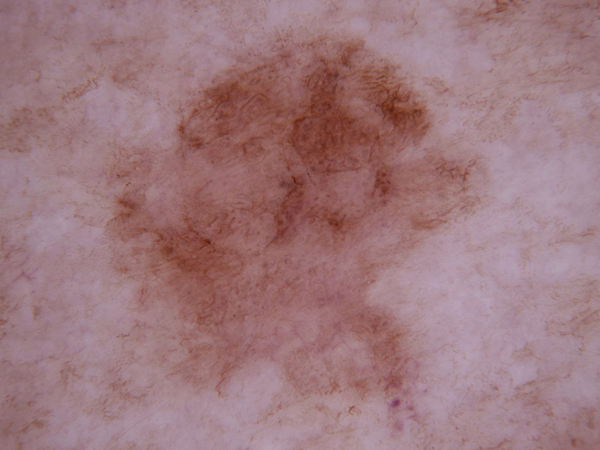

In [26]:
val_image_path = dataset.image_id[val_index] # image_idはmetadataにある画像のid番号

image_path = "./data/images"
val_image_path = os.path.join(image_path, val_image_path)
at_img = Image.open(val_image_path).convert("RGB")
print(dataset.image_id[val_index])
at_img.show()

In [31]:
# モデルを定義
import timm
import torch.nn as nn

num_classes = 7

def create_model(model_name="vit_base_patch16_224", num_classes=7):
    model = timm.create_model(model_name, pretrained=True)
    model.head = nn.Linear(model.num_features, 7)
    return model

In [32]:
# 前処理
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = create_model(num_classes=num_classes).to(device)

image_tensor = val_transform(at_img).unsqueeze(0).to(device)

In [33]:
dataset.labels

array([2, 2, 2, ..., 0, 0, 4])

In [34]:
dataset.image_id[:5]

['ISIC_0027419.jpg',
 'ISIC_0025030.jpg',
 'ISIC_0026769.jpg',
 'ISIC_0025661.jpg',
 'ISIC_0031633.jpg']

In [35]:
from collections import defaultdict
# valデータの中から、各クラス（0〜6）について、1枚ずつ「正解している画像」を見つけて保存
# クラスごとに1枚だけ保持する辞書
correct_samples = dict() # {class_id: (image_path, true_label, pred_label)}
model.eval()

for idx in val_idx:
    true_label = dataset.labels[idx]
    if true_label in correct_samples:
        continue # 正解画像を記録していたらスキップ

    # 元画像取得
    image_path = "./data/images"
    image_id = [f if f.endswith('.jpg') else f + ".jpg" for f in image_id]
    image_full_path = os.path.join(image_path, image_id[idx])
    pil_image = Image.open(image_full_path).convert("RGB")

    # 前処理→テンソルにして推論
    image_tensor = val_transform(pil_image).unsqueeze(0).to(device)
    with torch.no_grad():
        output = model(image_tensor)
        pred_label = torch.argmax(output, dim=1).item()

    # 正解していたら辞書に保存
    if pred_label == true_label:
        # デバッグ出力
        print(f"[idx {idx}] True: {true_label}, Pred: {pred_label}")
        # キーはクラスID（true_label）、値は (画像, 正解ラベル, 予測ラベル)
        correct_samples[true_label] = (pil_image, true_label, pred_label)
    
    if len(correct_samples) == 7:
        break

[idx 9459] True: 5, Pred: 5
[idx 460] True: 2, Pred: 2
[idx 2363] True: 6, Pred: 6
[idx 2766] True: 1, Pred: 1
[idx 2038] True: 4, Pred: 4
[idx 10008] True: 0, Pred: 0


In [36]:
print(len(correct_samples))

6


In [37]:
from collections import Counter

val_labels = [dataset.labels[idx] for idx in val_idx]
val_class_counts = Counter(val_labels)
print("Validationセットのクラスごとの枚数:")
for cls in sorted(val_class_counts.keys()):
    print(f"Class {cls}: {val_class_counts[cls]} 枚")

Validationセットのクラスごとの枚数:
Class 0: 98 枚
Class 1: 154 枚
Class 2: 330 枚
Class 3: 34 枚
Class 4: 334 枚
Class 5: 2012 枚
Class 6: 43 枚


クラス3はもともと画像が少なく、検証データに入っている34枚はすべて不正解だったことが分かった。よって、クラス3の不正解データを格納する。

In [38]:
for idx in val_idx:
    true_label = dataset.labels[idx]
    if true_label in correct_samples:
        continue # 正解画像を記録していたらスキップ

    # 元画像取得
    image_path = "./data/images"
    image_id = [f if f.endswith('.jpg') else f + ".jpg" for f in image_id]
    image_full_path = os.path.join(image_path, image_id[idx])
    pil_image = Image.open(image_full_path).convert("RGB")

    # 前処理→テンソルにして推論
    image_tensor = val_transform(pil_image).unsqueeze(0).to(device)
    
    with torch.no_grad():
        output = model(image_tensor)
        pred_label = torch.argmax(output, dim=1).item()

    # クラス3を抽出してcorrect_samplesに追加
    if true_label == 3:
        # デバッグ出力
        print(f"[idx {idx}] True: {true_label}, Pred: {pred_label}")
        # キーはクラスID（true_label）、値は (画像, 正解ラベル, 予測ラベル)
        correct_samples[true_label] = (pil_image, true_label, pred_label)

[idx 1122] True: 3, Pred: 1


In [39]:
print(len(correct_samples))

7


Class 5 True: 5, Pred: 5


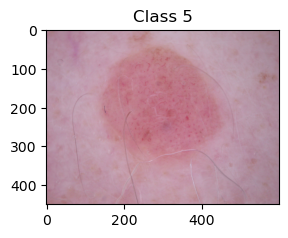

Class 2 True: 2, Pred: 2


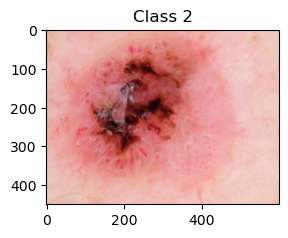

Class 6 True: 6, Pred: 6


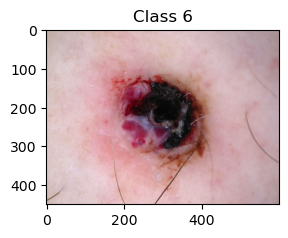

Class 1 True: 1, Pred: 1


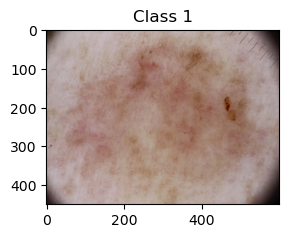

Class 4 True: 4, Pred: 4


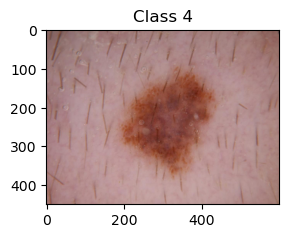

Class 0 True: 0, Pred: 0


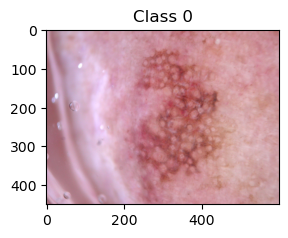

Class 3 True: 3, Pred: 1


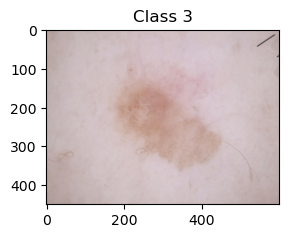

In [40]:
for class_id, (img, true_label, pred_label) in correct_samples.items():
    print(f"Class {class_id} True: {true_label}, Pred: {pred_label}")
    plt.subplots(figsize=(3, 3))
    plt.title(f"Class {class_id}")
    plt.imshow(img)
    plt.show()

In [41]:
model_save_path = "/works/best_model_f45e4f7e19294f869af4ce5c70e91366.pth"
model.load_state_dict(torch.load(model_save_path))
model.to(device)
model.eval()

/tmp/ipykernel_1631/2103379807.py:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_save_path))


VisionTransformer(
  (patch_embed): PatchEmbed(
    (proj): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
    (norm): Identity()
  )
  (pos_drop): Dropout(p=0.0, inplace=False)
  (patch_drop): Identity()
  (norm_pre): Identity()
  (blocks): Sequential(
    (0): Block(
      (norm1): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
      (attn): Attention(
        (qkv): Linear(in_features=768, out_features=2304, bias=True)
        (q_norm): Identity()
        (k_norm): Identity()
        (attn_drop): Dropout(p=0.0, inplace=False)
        (proj): Linear(in_features=768, out_features=768, bias=True)
        (proj_drop): Dropout(p=0.0, inplace=False)
      )
      (ls1): Identity()
      (drop_path1): Identity()
      (norm2): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
      (mlp): Mlp(
        (fc1): Linear(in_features=768, out_features=3072, bias=True)
        (act): GELU(approximate='none')
        (drop1): Dropout(p=0.0, inplace=False)
        (norm): Identity(

### hook_fn() を使って、attentions リストに attention weight を格納
- Vitは画像をパッチ分割→トークン化→Attentionで処理
- 224×224の画像を16×16パッチで分割すると、トークン数は224/16×224/16=14×14=196パッチトークン
- CLSトークン（画像全体の情報をまとめる役割をパッチトークンの先頭に一つ追加）を加えると197個になる
- Vitは最終的にこのCLSトークンの出力を使って分類を行う(Linear(CLS_output)→logit)

In [42]:
# AttentionヘッドはAttentionを複数視点で見るという役割
print(model.blocks[0].attn.num_heads)

12


In [43]:
print("image_tensor.shape:", image_tensor.shape)

image_tensor.shape: torch.Size([1, 3, 224, 224])


In [44]:
# 形の確認
attentions = []
def hook_fn(module, inputs, outputs):
    # qkv Linearに入る直前のテンソル
    x = inputs[0]
    print("input[0].shape", x.shape)
    print("outputs.shape", outputs.shape)
    attentions.append(x)
# hookを登録
hook = model.blocks[0].attn.qkv.register_forward_hook(hook_fn)
# 推論
with torch.no_grad():
    _ = model(image_tensor)
# hookを外す
hook.remove()

input[0].shape torch.Size([1, 197, 768])
outputs.shape torch.Size([1, 197, 2304])


- inputs[0]はqkv層の入力テンソルであり、形状[bath, token, 3*head_dim]（Q,K,Vを一つのLinearでまとめて出しているため）
- chunk(3. dim=-1)によって最後の次元をhead_dimごとにQ,K,Vへ分割→[batch, token, head_dim]

In [45]:
import math

# 注意マップを格納するリスト
attentions = []

def hook_fn(module, inputs, outputs):
    B, N, C = outputs.shape

    # Q, K, Vの出力を3つに分割
    Q, K, V = outputs.chunk(3, dim=-1) # dim=-1は最後の次元＝特徴量の次元

    num_heads = model.blocks[0].attn.num_heads
    head_dim = Q.shape[-1]  // num_heads

    # 分解して shape = [B, heads, tokens, head_dim]
    Q = Q.reshape(B, N, num_heads, head_dim).permute(0, 2, 1, 3) # multi-head attention の形にする
    K = K.reshape(B, N, num_heads, head_dim).permute(0, 2, 1, 3)

    # Self-Attentionのスコアを計算（Q@K^Tは各トークン間の類似度、squrt(K)でスケーリング）
    attn_score = torch.matmul(Q, K.transpose(-2, -1)) / math.sqrt(head_dim)

    # スコアを確率に変換するためにsoftmax関数を適用
    attn_weight = nn.functional.softmax(attn_score, dim=-1)

    # 注意マップを格納
    attentions.append(attn_weight)

    # attn_weightの形状を出力
    print(attn_weight.shape) # [batch_size, num_heads, num_tokens, num_tokens]

attentions = [ attn_weight(batch=1, heads=6, tokens=197, tokens=197) ]
                  │
                  └── attentions[0] → shape = [1, 6, 197, 197]
                         │
                         └── attentions[0][0] → shape = [6, 197, 197]

torch.Size([1, 12, 197, 197])
torch.Size([12, 197, 197])


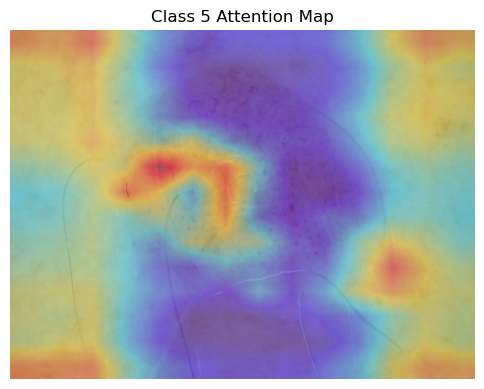

torch.Size([1, 12, 197, 197])
torch.Size([12, 197, 197])


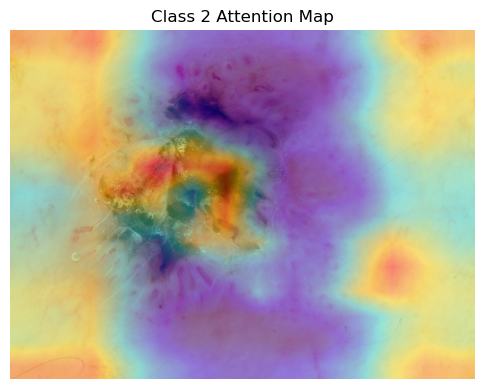

torch.Size([1, 12, 197, 197])
torch.Size([12, 197, 197])


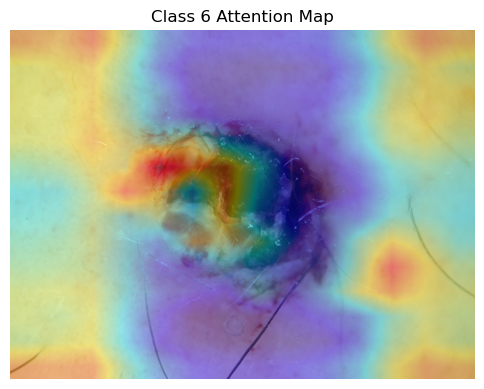

torch.Size([1, 12, 197, 197])
torch.Size([12, 197, 197])


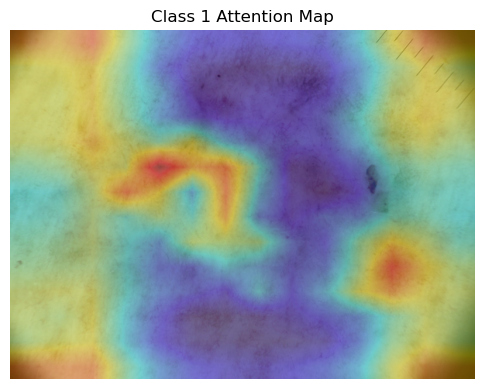

torch.Size([1, 12, 197, 197])
torch.Size([12, 197, 197])


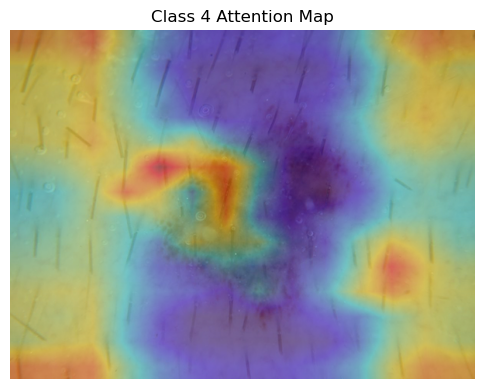

torch.Size([1, 12, 197, 197])
torch.Size([12, 197, 197])


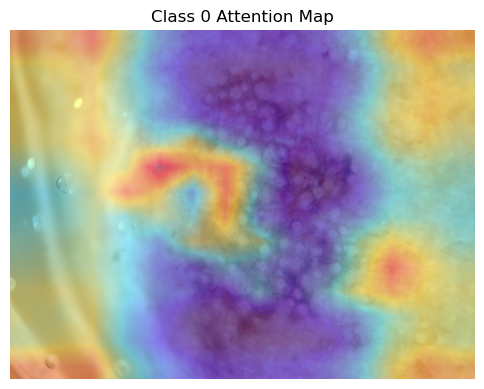

torch.Size([1, 12, 197, 197])
torch.Size([12, 197, 197])


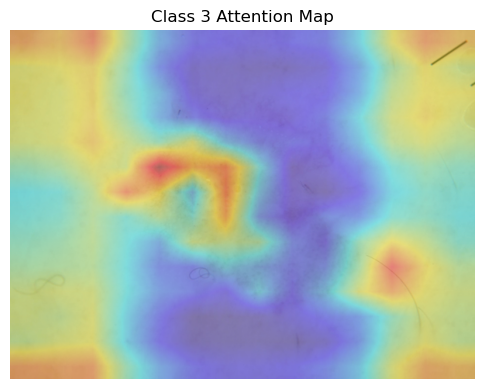

In [46]:
import cv2
for class_id, (img, true_label, pred_label) in correct_samples.items():
    # hook登録
    hook = model.blocks[0].attn.qkv.register_forward_hook(hook_fn)
    # 推論
    with torch.no_grad():
        _ = model(image_tensor)
    hook.remove()

    # Attention Mapを1枚生成
    attn = attentions[0][0]  # [num_heads, num_tokens, num_tokens]
    print(attn.shape)
    attn_map = attn[:, 0, 1:].mean(0).reshape(14, 14).cpu().numpy() # 全ヘッドで「CLS → パッチ」の注意を見る
    attn_map = cv2.resize(attn_map, img.size)  # 元画像サイズに拡大

    # 可視化
    # attention値を0~1に正規化
    heatmap = (attn_map - attn_map.min()) / (attn_map.max() - attn_map.min())
    heatmap = cv2.applyColorMap((heatmap * 255).astype(np.uint8), cv2.COLORMAP_JET)
    # 元画像をnumpy配列にしてBGRへ変換
    image_np = np.array(img)
    image_bgr = cv2.cvtColor(image_np, cv2.COLOR_RGB2BGR)
    # ヒートマップと画像を合成
    superimposed = cv2.addWeighted(image_bgr, 0.6, heatmap, 0.4, 0)

    # 表示
    plt.figure(figsize=(6, 6))
    plt.title(f'Class {class_id} Attention Map')
    plt.imshow(cv2.cvtColor(superimposed, cv2.COLOR_BGR2RGB)) # RGBに戻す
    plt.axis('off')
    plt.show()

## Grad-CAM

[VitでGradCAMを実装した分かりやすい例](https://github.com/Mikael17125/ViT-GradCAM)

In [170]:
# Vitの中間層から特徴量と勾配を取得し、ヒートマップを作成
class GradCam:
    def __init__(self, model, target):
        self.model = model.eval() # 推論モード
        self.feature = None # forward hookで取得する特徴マップの格納先
        self.gradient = None # backward hookで取得する勾配マップの格納先
        self.target = target # Grad-CAMをかけたい層
        self._get_hook() # hook関数をtargetに登録

    # 順伝番から特徴量を得る
    def _get_features_hook(self, module, input, output):
        self.feature = self.reshape_transform(output) # [batch, tokens, dim] → [batch, channels, H, W] に変換
    # 逆伝播から特徴量を得る
    def _get_grads_hook(self, module, input_grad, output_grad):
        self.gradient = self.reshape_transform(output_grad[0]) # 勾配テンソル（＝backwardで流れてきた値）を変換

        # def _store_grad(grad):
            #self.gradient = self.reshape_transform(grad)
        
        #output_grad[0].register_hook(_store_grad) # 勾配を保存するフックをさらに登録
    
    # targetにforward/backwardの両方のhookを登録
    def _get_hook(self):
        self.target.register_forward_hook(self._get_features_hook)
        self.target.register_full_backward_hook(self._get_grads_hook)

    # 可視化のための成型
    def reshape_transform(self, tensor, height=14, width=14):
        #入力（Vitの特徴マップ）を変換
        tensor = tensor[:, 1:, :].reshape(tensor.size(0), height, width, tensor.size(2)) # CLSトークンを除外 → [B, 196, D(768)] → [B, H, W, C]で空間構造に並べなおす
        tensor = tensor.permute(0, 3, 1, 2) # CNNと同じ形式[B, C, H, W]に並べ替え
        return tensor

    # Grad-CAMの計算(推論 → 逆伝播 → CAM作成（勾配×特徴量 → 加重和 → ReLU → 正規化）)
    def __call__(self, inputs):
        device = next(self.model.parameters()).device # モデルと同じデバイスを取得
        inputs = inputs.to(device)

        self.model.zero_grad()
        output = self.model(inputs) # 入力画像でforward実行
        
        # 最もスコアが高いクラスのindexを取得
        index = np.argmax(output.cpu().data.numpy())
        
        # 最もスコアが高いクラスの出力を backward
        target = output[0][index]
        target.backward()

        # 勾配と特徴マップの取得
        gradient = self.gradient[0].detach().numpy()
        feature = self.feature[0].detach().numpy()

        # 各チャネルの勾配を平均化（重要度スコア）
        weight = np.mean(gradient, axis=(1,2))
        
        # チャネルごとに重み付き和を計算
        cam = np.sum(feature * weight[:, np.newaxis, np.newaxis], axis=0)
        cam = np.maximum(cam, 0) # ReLU

        # 正規化
        cam -= np.min(cam)
        cam /= np.max(cam + 1e-8)
        # リサイズ
        cam = cv2.resize(cam, (224, 224))
        return cam

In [ ]:
from gradcam.utils import visualize_cam
from gradcam import GradCAM, GradCAMpp

# この関数は使用せず、attentionmpの可視化で用いたコードを使用
# ヒートマップを元画像に重ねて可視化していく（imageは元画像RGB, 正規化済、maskはヒートマップ[H, W]）
def gen_cam(image, mask):
    # maskは0~1のグレー画像なのでそれを0~255のunit8に変換
    heatmap = cv2.applyColorMap(np.unit8(255 * mask), cv2.COLORMAP_JET)
    heatmap = np.float32(heatmap) / 255 # カラー画像に変換した後にまた[o~1]に戻す
    # 元画像との合成
    cam = (1 - 0.5) * heatmap + 0.5 * image
    cam = cam / np.max(cam) # 正規化（最大値で割る）
    return np.unit8(255 * cam)

In [172]:
model = timm.create_model('vit_base_patch16_224', pretrained=False, num_classes=7)
model_save_path = "/works/best_model_f45e4f7e19294f869af4ce5c70e91366.pth"
device = torch.device('cpu')
model.load_state_dict(torch.load(model_save_path))
model.eval()

/tmp/ipykernel_1631/2183108583.py:4: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_save_path))


VisionTransformer(
  (patch_embed): PatchEmbed(
    (proj): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
    (norm): Identity()
  )
  (pos_drop): Dropout(p=0.0, inplace=False)
  (patch_drop): Identity()
  (norm_pre): Identity()
  (blocks): Sequential(
    (0): Block(
      (norm1): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
      (attn): Attention(
        (qkv): Linear(in_features=768, out_features=2304, bias=True)
        (q_norm): Identity()
        (k_norm): Identity()
        (attn_drop): Dropout(p=0.0, inplace=False)
        (proj): Linear(in_features=768, out_features=768, bias=True)
        (proj_drop): Dropout(p=0.0, inplace=False)
      )
      (ls1): Identity()
      (drop_path1): Identity()
      (norm2): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
      (mlp): Mlp(
        (fc1): Linear(in_features=768, out_features=3072, bias=True)
        (act): GELU(approximate='none')
        (drop1): Dropout(p=0.0, inplace=False)
        (norm): Identity(

In [173]:
model.blocks[-1]

Block(
  (norm1): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
  (attn): Attention(
    (qkv): Linear(in_features=768, out_features=2304, bias=True)
    (q_norm): Identity()
    (k_norm): Identity()
    (attn_drop): Dropout(p=0.0, inplace=False)
    (proj): Linear(in_features=768, out_features=768, bias=True)
    (proj_drop): Dropout(p=0.0, inplace=False)
  )
  (ls1): Identity()
  (drop_path1): Identity()
  (norm2): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
  (mlp): Mlp(
    (fc1): Linear(in_features=768, out_features=3072, bias=True)
    (act): GELU(approximate='none')
    (drop1): Dropout(p=0.0, inplace=False)
    (norm): Identity()
    (fc2): Linear(in_features=3072, out_features=768, bias=True)
    (drop2): Dropout(p=0.0, inplace=False)
  )
  (ls2): Identity()
  (drop_path2): Identity()
)

In [174]:
# Grad-CAM対称像（target）を指定（VitはCNNのような空間特徴マップがないので後段の層でまだ空間的情報が保たれている層を使う）
target_layer = model.blocks[-1].norm1

In [175]:
for class_id, (img, true_label, pred_label) in correct_samples.items():
    print(f"Class {class_id} True: {true_label}, Pred: {pred_label}")

Class 5 True: 5, Pred: 5
Class 2 True: 2, Pred: 2
Class 6 True: 6, Pred: 6
Class 1 True: 1, Pred: 1
Class 4 True: 4, Pred: 4
Class 0 True: 0, Pred: 0
Class 3 True: 3, Pred: 1


In [182]:
for class_id, (pil_img, true_label, pred_label) in correct_samples.items():
    print(f"Class {class_id} pil_img: {pil_img}, True: {true_label}, Pred: {pred_label}")

Class 5 pil_img: <PIL.Image.Image image mode=RGB size=600x450 at 0x7FE7CC01ED10>, True: 5, Pred: 5
Class 2 pil_img: <PIL.Image.Image image mode=RGB size=600x450 at 0x7FE823C81690>, True: 2, Pred: 2
Class 6 pil_img: <PIL.Image.Image image mode=RGB size=600x450 at 0x7FE7CC0B19D0>, True: 6, Pred: 6
Class 1 pil_img: <PIL.Image.Image image mode=RGB size=600x450 at 0x7FE7D5DFDA50>, True: 1, Pred: 1
Class 4 pil_img: <PIL.Image.Image image mode=RGB size=600x450 at 0x7FE7CC036D50>, True: 4, Pred: 4
Class 0 pil_img: <PIL.Image.Image image mode=RGB size=600x450 at 0x7FE7CD48DB50>, True: 0, Pred: 0
Class 3 pil_img: <PIL.Image.Image image mode=RGB size=600x450 at 0x7FE7CC07DD10>, True: 3, Pred: 1


In [176]:
image_tensor.shape

torch.Size([1, 3, 224, 224])

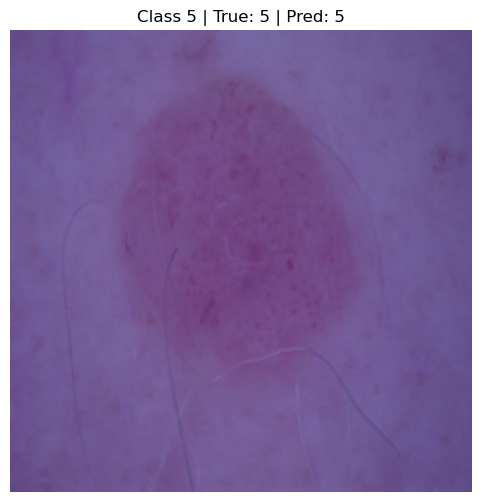

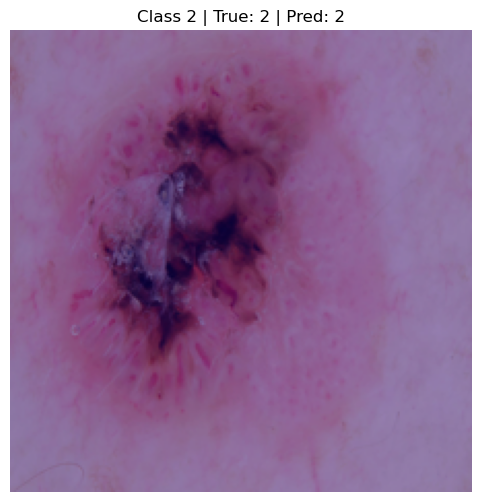

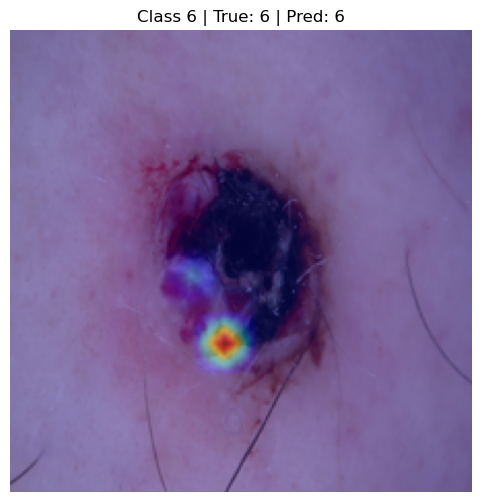

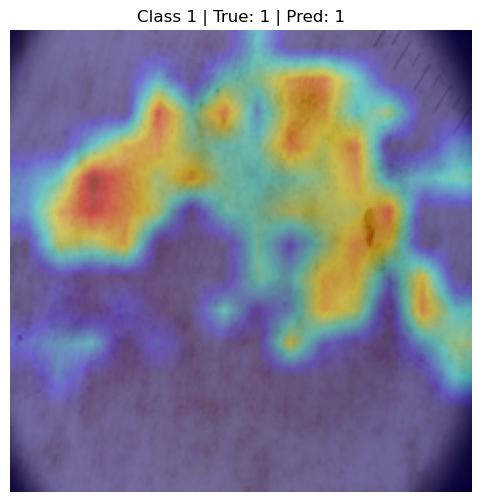

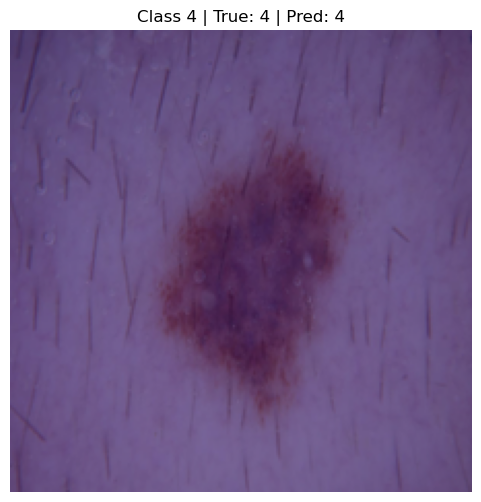

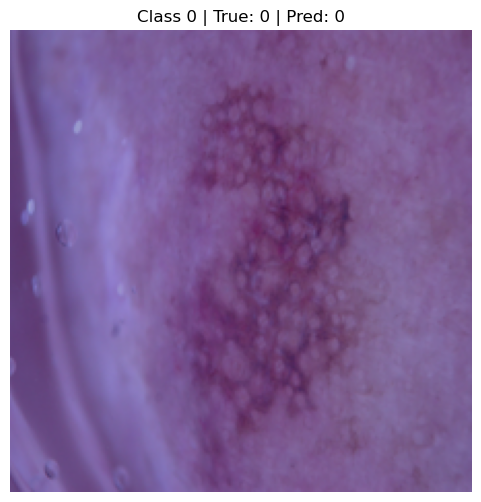

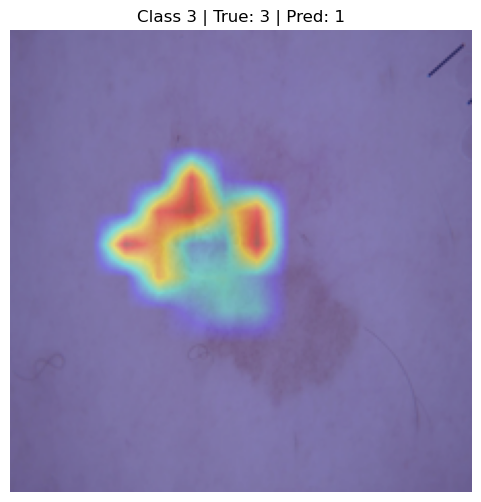

In [184]:
# 各クラスの画像に対してGrad-CAMを計算
for class_id, (pil_img, true_label, pred_label) in correct_samples.items():
    image_tensor = val_transform(pil_img).unsqueeze(0)

    # モデルに入力してGrad-CAMマスクを生成
    grad_cam = GradCam(model, target_layer) # インスタンス生成
    cam_mask = grad_cam(image_tensor) # __call__() が発動

    # 正規化
    #heatmap = (cam_mask - cam_mask.min()) / (cam_mask.max() - cam_mask.min()) 0で割り算が発生
    cam_min = cam_mask.min()
    cam_max = cam_mask.max()
    denom = cam_max - cam_min

    if denom == 0:
        heatmap = np.zeros_like(cam_mask) # 全部ゼロのマップ
    else:
        heatmap = (cam_mask - cam_min) / denom

    heatmap = np.nan_to_num(heatmap) # NaN 除去

    # 元画像をnumpy配列にしてBGRへ変換
    image_np = np.array(pil_img.resize((224, 224))) # PIL → Numpy
    image_bgr = cv2.cvtColor(image_np, cv2.COLOR_RGB2BGR) # RGB → BGR

    # camをヒートマップカラーに変換
    heatmap = cv2.applyColorMap((heatmap * 255).astype(np.uint8), cv2.COLORMAP_JET)
    # ヒートマップをリサイズして元画像に合わせる
    heatmap = cv2.resize(heatmap, (image_bgr.shape[1], image_bgr.shape[0]))

    # ヒートマップと画像を合成
    superimposed = cv2.addWeighted(image_bgr, 0.6, heatmap, 0.4, 0)
    
    plt.figure(figsize=(6,6))
    plt.title(f"Class {class_id} | True: {true_label} | Pred: {pred_label}")
    plt.imshow(cv2.cvtColor(superimposed, cv2.COLOR_BGR2RGB)) # RGBに戻す
    plt.axis('off')
    plt.show()

- ヒートマップ全体が暗い → 意味のある重みを出せていない
- backward()しても対象層まで勾配が流れてこない？

In [188]:
for class_id, (pil_img, true_label, pred_label) in correct_samples.items():
    image_tensor = val_transform(pil_img).unsqueeze(0)

    # モデルに入力してGrad-CAMマスクを生成
    grad_cam = GradCam(model, target_layer) # インスタンス生成
    cam_mask = grad_cam(image_tensor) # __call__() が発動
    
    print(f"[Class {class_id}] CAM max: {cam_mask.max():.4f}, mean: {cam_mask.mean():.4f}")

[Class 5] CAM max: 0.0000, mean: 0.0000
[Class 2] CAM max: 0.0000, mean: 0.0000
[Class 6] CAM max: 0.9384, mean: 0.0065
[Class 1] CAM max: 0.9896, mean: 0.2059
[Class 4] CAM max: 0.0000, mean: 0.0000
[Class 0] CAM max: 0.0000, mean: 0.0000
[Class 3] CAM max: 0.9726, mean: 0.0506


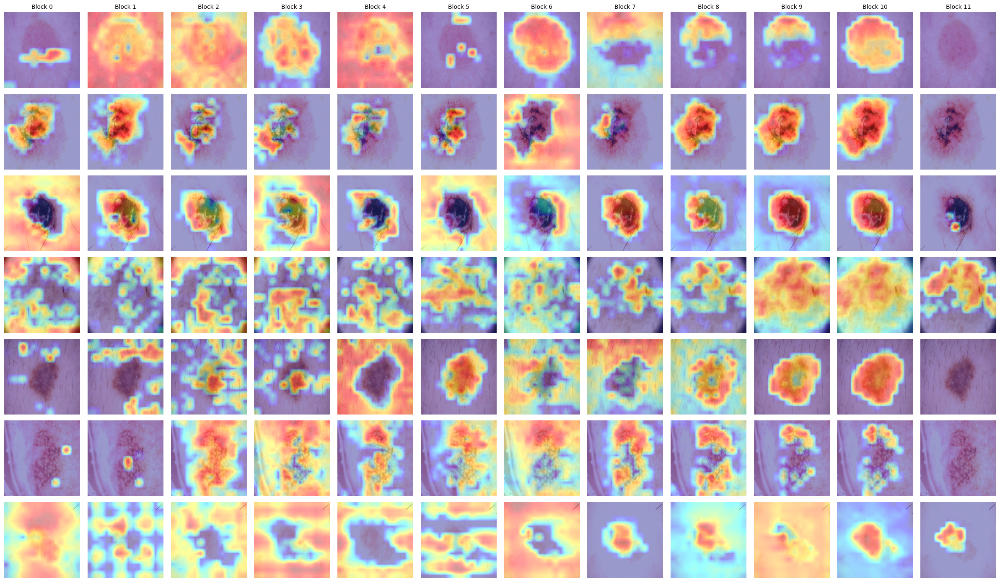

In [193]:
num_blocks = len(model.blocks)
num_classes = len(correct_samples)

fig, axes = plt.subplots(nrows=num_classes, ncols=num_blocks, figsize=(num_blocks * 2, num_classes * 2))

for row, (class_id, (pil_img, true_label, pred_label)) in enumerate(correct_samples.items()):
    image_tensor = val_transform(pil_img).unsqueeze(0)  # 各画像に対して再生成

    for col, block in enumerate(model.blocks):
        target_layer = block.norm1 
        grad_cam = GradCam(model, target_layer)
        cam_mask = grad_cam(image_tensor)

        # スケーリング（ゼロ除算を避ける）
        cam_min = cam_mask.min()
        cam_max = cam_mask.max()
        denom = cam_max - cam_min
        heatmap = np.zeros_like(cam_mask) if denom == 0 else (cam_mask - cam_min) / denom
        heatmap = np.nan_to_num(heatmap)

        # ヒートマップ強調
        heatmap = np.power(heatmap, 0.5)

        # ヒートマップ → カラー変換
        heatmap_color = cv2.applyColorMap((heatmap * 255).astype(np.uint8), cv2.COLORMAP_JET)
        heatmap_color = cv2.resize(heatmap_color, (224, 224))

        # 元画像 → BGR化 + 明るさ補正
        image_np = np.array(pil_img.resize((224, 224)))
        image_bgr = cv2.cvtColor(image_np, cv2.COLOR_RGB2BGR)
        image_bgr = cv2.convertScaleAbs(image_bgr, alpha=1.2, beta=30)

        # 合成
        superimposed = cv2.addWeighted(image_bgr, 0.6, heatmap_color, 0.4, 0)
        superimposed_rgb = cv2.cvtColor(superimposed, cv2.COLOR_BGR2RGB)

        ax = axes[row, col]
        ax.imshow(superimposed_rgb)
        ax.axis("off")
        if row == 0:
            ax.set_title(f"Block {col}", fontsize=10)
        if col == 0:
            ax.set_ylabel(f"Class {class_id}\nTrue: {true_label}\nPred: {pred_label}", fontsize=10)

plt.tight_layout()
plt.show()

- 全層のattention_mapを可視化すると、真ん中くらいの層は分類に影響を与えていそうだった。
- この後、CNN系のモデルでもgrad-CAMを実施してみて、結果を比べてみたい。